In [1]:
import json
import matplotlib.pyplot as plt
import numpy as np
from pandas import DataFrame as pd
import pandas as pd

In [2]:
df = pd.read_csv("dataset.csv")
del df["Unnamed: 0"]

df

,adjusted_close,close,date,dividend_amount,high,id,low,open,split_coefficient,symbol,volume
0,10.6408,131.13,1998-01-02,0.0,131.500,MSFT1998-01-02,129.500,129.63,1.0,MSFT,4968500
1,10.5799,130.38,1998-01-05,0.0,133.630,MSFT1998-01-05,127.870,131.25,1.0,MSFT,10047200
2,10.6408,131.13,1998-01-06,0.0,133.000,MSFT1998-01-06,129.250,129.75,1.0,MSFT,8479300
3,10.5134,129.56,1998-01-07,0.0,131.190,MSFT1998-01-07,127.500,129.88,1.0,MSFT,7686600
4,10.5897,130.50,1998-01-08,0.0,132.130,MSFT1998-01-08,127.500,128.63,1.0,MSFT,9702400
5,10.3057,127.00,1998-01-09,0.0,131.500,MSFT1998-01-09,125.870,130.06,1.0,MSFT,10941800
6,10.5085,129.50,1998-01-12,0.0,130.000,MSFT1998-01-12,124.370,124.62,1.0,MSFT,9799200
7,10.7220,132.13,1998-01-13,0.0,132.250,MSFT1998-01-13,128.130,129.50,1.0,MSFT,8368200
8,10.6408,131.13,1998-01-14,0.0,132.500,MSFT1998-01-14,129.250,132.13,1.0,MSFT,6846800
9,10.7366,132.31,1998-01-15,0.0,133.000,MSFT1998-01-15,129.880,130.38,1.0,MSFT,6327800


In [3]:
from sklearn.base import BaseEstimator, ClassifierMixin

class stockTransformer(BaseEstimator, ClassifierMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, tmp, y=None):
        print("Transform")
        
        #Vi tittar tillbaka {i} dagar
        try:
            for j in [1,2,3,5,10,20,100,150]: #range(1, 10):
                for c in ["adjusted_close", "high", "low", "open", "volume"]: #"close", 
                    tmp["hist_{}_{}".format(c,j)] = (tmp[c].shift(j) - tmp[c]) / tmp[c]

            # Date -> month / day
            tmp.date = tmp.date.astype(str)
            tmp["month"] = tmp["date"].apply(lambda x : int(str(x).split("-")[1]))
            tmp["day"] = tmp["date"].apply(lambda x : int(str(x).split("-")[2]))

            tmp = tmp.drop(["adjusted_close", "close", "date", "dividend_amount", "high", "id", "low", "open", "split_coefficient", "symbol", "volume"], axis=1)
#             print(tmp.info())
            return tmp.fillna(-1)  # TODO - ta bort NaN från både X/Y
            
        except Exception as e:
            print(e)
            return None
        
    def predict(self, X, y=None):
        return(X)

    def score(self, X, y=None):
        return(sum(self.predict(X))) 

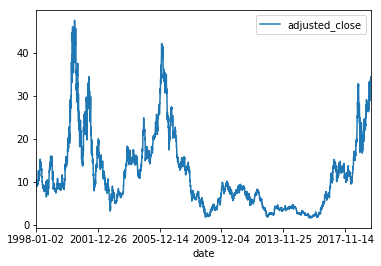

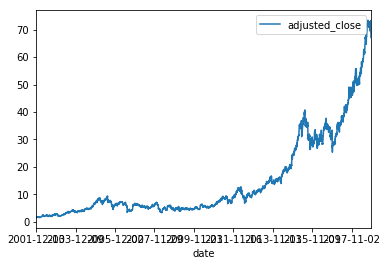

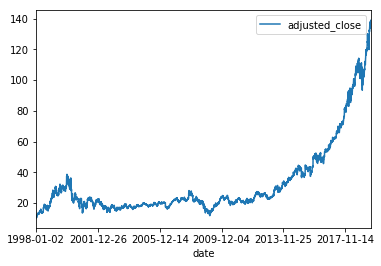

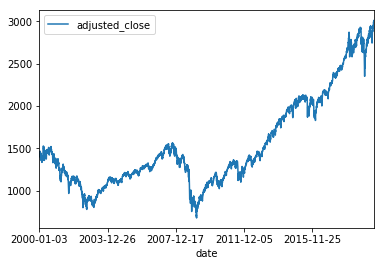

In [4]:
df[:20000].groupby("symbol")[["adjusted_close", "date"]].plot(x="date")
plt.show()

/home/hades/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


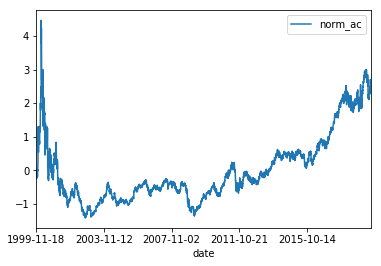

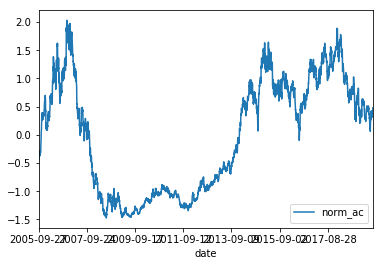

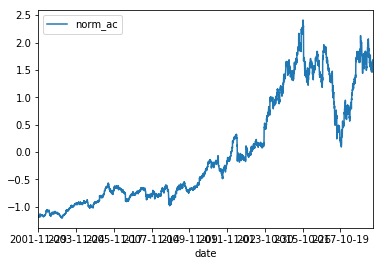

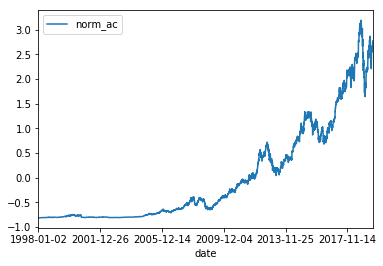

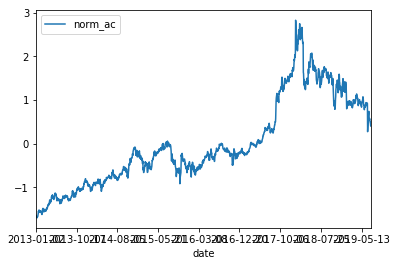

...

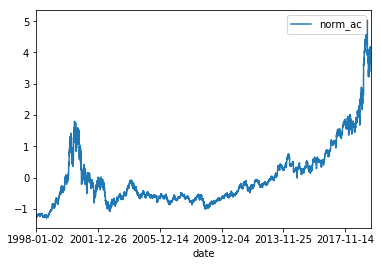

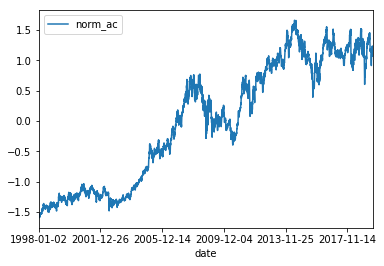

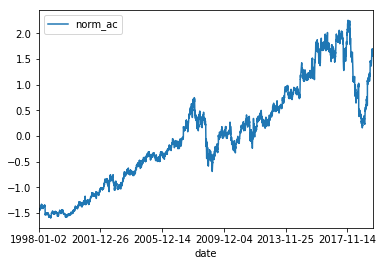

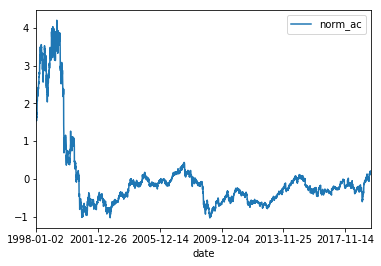

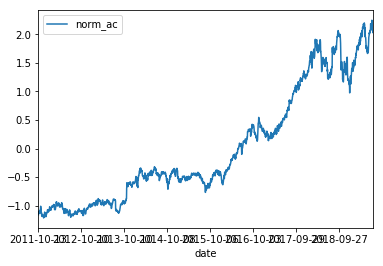

In [5]:
df["norm_ac"] = df.groupby("symbol").adjusted_close.transform(lambda x: (x - x.mean()) / x.std())

df.groupby("symbol")[["norm_ac", "date"]].plot(x="date")
plt.show()

# ML

In [8]:
# Target value - i days into the future
days_into_future_predict = 10
target = (df["adjusted_close"].shift(-days_into_future_predict) - df["adjusted_close"]) / df["adjusted_close"]
targetBin = target.map(lambda x: x>0)

In [9]:
from sklearn.model_selection import train_test_split

Y = target.fillna(0)[:100000:2]
X = df[:100000:2]

x_train, x_test, y_train, y_test = train_test_split(X, Y)

In [10]:
import warnings
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics.regression import mean_squared_error, mean_absolute_error, r2_score

def eval_metrics(actual, pred):
    mse = mean_squared_error(actual, pred) 
    msa = mean_absolute_error(actual, pred)
    r2 = r2_score(actual, pred)
    return mse, msa, r2

warnings.filterwarnings("ignore")
np.random.seed(40)        

In [11]:
from sklearn.pipeline import Pipeline
# from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

clf = XGBRegressor()
lr = Pipeline([('customTransformer', stockTransformer()), ("ML", clf)])
lr.fit(x_train, y_train)

# Evaluate Metrics
pred = lr.predict(x_test)
mse, msa, r2 = eval_metrics(y_test, pred)

# Print out metrics
print("  MSA: %s" % msa)
print("  MSE: %s" % mse)
print("  R2: %s" % r2)

Transform
[12:28:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Transform
  MSA: 0.0509472071393
  MSE: 0.0265413820545
  R2: -0.940246607731


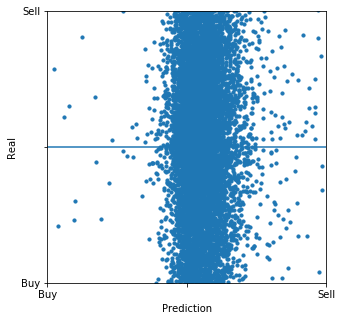

In [298]:
import matplotlib.lines as mlines

def plot_cm(pred, y_test):
    scl = 0.05
    plt.figure(figsize=(5, 5))
    plt.scatter(pred, y_test, s=10)
    plt.xlabel("Prediction")
    plt.ylabel("Real")
    ax = plt.gca()
    plt.xlim([-scl, scl])
    plt.ylim([-scl, scl])
    plt.xticks([-scl,0,scl], ["Buy", "", "Sell"])
    plt.yticks([-scl,0,scl], ["Buy", "", "Sell"])
    l1 = mlines.Line2D([0, 0], [-1, 1])
    l2 = mlines.Line2D([-1, 1], [0, 0])
    ax.add_line(l1)
    ax.add_line(l2)
    plt.show()
    
plot_cm(pred, y_test)

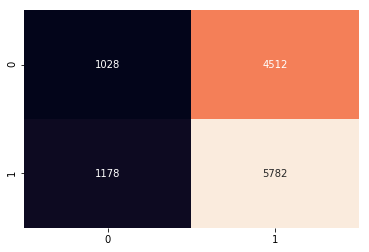

In [299]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

def runda(v):
    if v>0:
        return 1
    return 0

y_test_binary = list(map(runda, y_test))
y_pred_binary = list(map(runda, pred))

cm = confusion_matrix(y_test_binary, y_pred_binary)
sns.heatmap(cm, fmt="d", annot=True, cbar=False)
plt.show()

In [300]:
from sklearn.metrics import accuracy_score

print("Accuracy score", accuracy_score(y_test_binary, y_pred_binary))

Accuracy score 0.5448


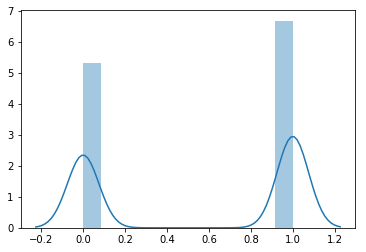

In [301]:
sns.distplot(y_test_binary)
plt.show()

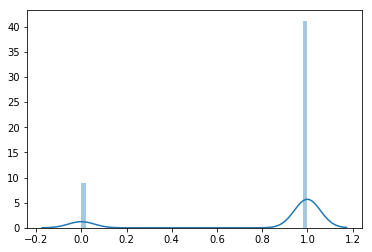

In [302]:
sns.distplot(y_pred_binary)
plt.show()

In [303]:
tmp = lr.steps[1][1] #.feature_importance_
feature_imp = tmp.feature_importances_
features = stockTransformer().transform(df[:1]).columns

Transform


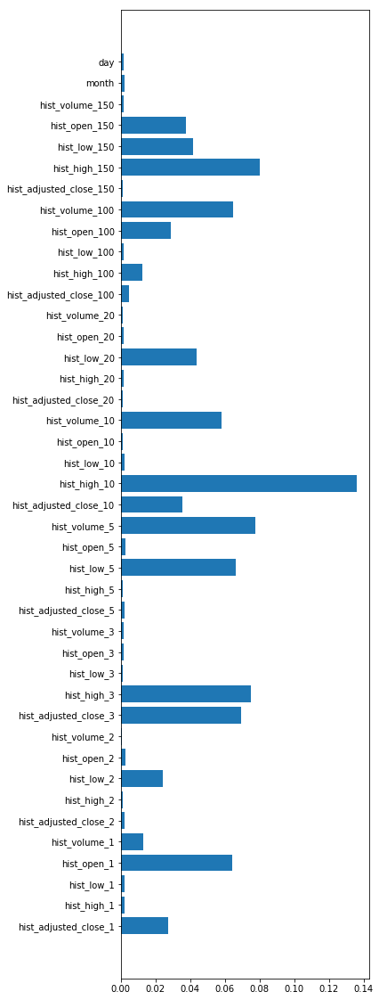

42 42


In [306]:
plt.figure(figsize=(5,20))
plt.barh(range(len(feature_imp)), feature_imp)
plt.yticks(range(len(features)), features)
plt.show()
print(len(feature_imp), len(features))